<a href="https://colab.research.google.com/github/chumh07/econ148_final/blob/main/ECON_148_PROJECT_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECON 148 Final Project Template
### Spring 2023


Prof: Eric Van Dusen  
TAs: Yiyang Chen, Peter Grinde-Hollevik

# Factors Affecting Life Expectancy: An Analysis Using Linear, Lasso and Random Forest Regression

### Group Members:
Avyakth Challa : Data Cleaning, Model Analysis, Interpretations and Conclusions (5 hours)

Hanh Chu: Modeling Motivation, Data Description, Graph Description (5 hours)

Erik Fraga: Abstract, Project background, Modeling Motivation and Interpretation and Conclusion (5 hours)

Vishal Sodem: Data cleaning (description), EDA, implemented feature engineering, Modeling (5 hours)




## Source Data - Opportunity Insights

In order to make the project consistent across teams, we are limiting the project to a specific set of datasets that are linked to economics journal articles.  

Browse and choose one of the datasets from Harvard Professor Raj Chetty's [Equality of Opportunity Project](http://www.equality-of-opportunity.org/data/). You will find them neatly presented (and mostly cleaned) together with the title of the corresponding research paper.

You should start by reading the accompanying paper, and start your analysis by exploring some of the claims or analysis that you find in the paper (it is not your goal to fully replicate the analysis in the paper). You should then propose some new analysis that you can do with the dataset.


In [ ]:
import pandas as pd
import numpy as np
import requests
from io import StringIO
import plotly.express as px
from urllib.request import urlopen
import json
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
sns.set()

In [ ]:


def get_dataset(url):
  headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/56.0.2924.76 Safari/537.36'}
  s = requests.get(url, headers=headers).text
  return pd.read_csv(StringIO(s))
# https://opportunityinsights.org/wp-content/uploads/2018/04/health_ineq_online_table_11_readme.pdf
cty_life_income = get_dataset('https://opportunityinsights.org/wp-content/uploads/2018/04/health_ineq_online_table_11.csv')
# https://opportunityinsights.org/wp-content/uploads/2018/04/health_ineq_online_table_12_readme.pdf
cty_char = get_dataset('https://opportunityinsights.org/wp-content/uploads/2018/04/health_ineq_online_table_12.csv')

## Abstract

In this project, we sought to examine two variables of interest, obesity and local government expenditures, and their effect on life expectancy when controlling for income quartiles and gender. We took large inspiration from Raj Chetty et.al work on their paper, “The Association Between Income and Life Expectancy in the United States, 2001-2014”. In particular, we utilized two datasets measured at the county level from their paper in order to answer our research questions. We then did some exploratory data analysis to determine any general trends that were visible in both of our variables of interest. After that, we performed linear regressions on both of our variables to determine the statistical significance of each respective variable of interest. However, for our first prediction question on obesity rate and its effect on life expectancy, we utilized a lasso regression to see if the obesity variable is an important predictor. For our second prediction question, we utilized a random forest regressor to determine the feature importance of local government expenditure. Ultimately, what we found is that both obesity and local government expenditure do affect life expectancy, but the effect of local government expenditure was minimal.

## Project Background


Raj Chetty, along with other notable researchers, delve deeper into the association between income and life expectancy, taking into account geographic variablity in their paper. Four of the main key takeaways that have resulted from their research are as follows. First, they state that having a higher income is associated with a longer life expectancy throughout the different income groups. Secondly, they claim the inequality between those in the top 5% of the income distribution and the bottom 5% increased over time between both genders, primarily because individuals from the top income quartile had an increase of 3 years in life expectancy, whereas the life expectancy of individuals in the bottom quartile remained the same. Third, they acknowledge that life expectancy differed across different local geographies. Fourth, for the individuals in the lowest income quartiles, they have found that health behaviors, such as smoking behaviors are strongly correlated with life expectancy, but found that access to medical, physical environmental factors, income inequality, and labor market conditions were not. For our project, we wish to explore this fourth claim in further detail, particularly, examining the impact of obesity on life expectancy thoughout the different income quartiles. Additionally, we seek to explore the impact of local government support on life expectancy, specifically on local government expenditures across the different income quartiles. In terms of our motivation, life expectancy is an important value to humans, and so it is in one’s best interest to maximize life expectancy to be able to enjoy life more. Furthermore, it is important to be able to do quantitative analysis for life expectancy, because it can be used to guide policy makers in their decisions in determining which policy is best for long term health. That is why we are focusing in on the two variables that we selected; obesity and local government expenditures. The obesity variable, we expect to have a negative association to life expectancy. Whereas with local government expenditure variable, we expect it to have a positive association to life expectancy.


## Project Objective

**Question 1 :**
The purpose of the first question is to determine the impact of obesity on life expectancy throughout different income quartiles. This is an important question because while it is generally understood that obesity has a negative effect on life expectancy, we want to evaluate whether this relationship is affected by income levels.

**Question 2 :**
The purpose of the second question is to measure the impacts of local government expenditures on life expectancy across different income quartiles. This is a useful relationship to understand because it could be used to help make government budget decisions.


## Data Description
The Opportunity Insights team constructed datasets by obtaining income data for the US population from 1.4 billion deidentified tax records between 1999 and 2014. The data was then used to estimate race- and ethnicity-adjusted life expectancy at 40 years of age by household income percentile, sex, and geographic area. Mortality data were also obtained from Social Security Administration death records. These datasets were used to evaluate factors associated with differences in life expectancy. Overall, the team used a large amount of income and mortality data to construct their datasets and analyze factors affecting life expectancy.

## Data Cleaning

The 2 datasets (county characteristics and county life expectancy/income quartile data) are merged based on the county's FIPS code; each row is a county, with the columns being county characteristics and life expectancy by income quartile (i.e. obesity fraction by income quartile, life expectancy by income quartile, population, government expenditures, etc.). We added an additional feature for the purposes of visualization (life expectancy weighted by the proportion of male and female within each county and quartile); this feature is not included in our modeling. We added a feature (local government expenditures per capita) in order to normalize between counties with different populations, and omit counties with 0 local government expenditures as these counties are around New York City and purposely set to 0 in order to avoid double-counting (New York City spans multiple counties).

We then performed data transformations to make linear modeling more effective and reduce model error (log transform of local government expenditures and local government expenditures per capita).

We also create dummy variables for quartile and gender for the purposes of modeling. In doing so, each row then reflects a specific county-gender-quartile subset of the population within the county (i.e. Alameda County, 1st income quartile, male), with 8 rows for each county.

As the life expectancy dataset only contains data on counties with a population over 25k, we omit counties (rows) that do not have either life expectancy or obesity fraction to answer our first question, and either life expectancy or local government expenditures for our second question. Additionally, we filter out the top and bottom 1% of the variables of interest for each model (obesity fraction and per capita local government expenditures) to get rid of outliers.

As we still have a significant amount of data, we feel that this does not limit our model (however our conclusions are limited to those concerning counties with populations over 25k).

In [ ]:
cty_char = cty_char.rename(columns={'cty': 'fips'})
cty_life_income = cty_life_income.rename(columns={'cty': 'fips'})

In [ ]:
count_cols = list(filter(lambda x: 'count_' in x, cty_life_income.columns))
for q in ['q1', 'q2', 'q3', 'q4']:
  cty_life_income[f'count_{q}'] = cty_life_income.filter(regex=f'count_{q}_', axis=1).sum(axis=1)
  df_temp = cty_life_income.filter(regex=f'count_{q}_', axis=1).div(cty_life_income[f'count_{q}'], axis=0)
  df_temp.columns = df_temp.columns.str.replace('count', 'pct')
  le_temp = cty_life_income.filter(regex=f'^le_agg_{q}_', axis=1)
  df_temp[f'weighted_le_{q}'] = le_temp.filter(regex='_M', axis=1).iloc[:, 0] * df_temp.filter(regex='_M', axis=1).iloc[:, 0] \
                              + le_temp.filter(regex='_F', axis=1).iloc[:, 0] * df_temp.filter(regex='_F', axis=1).iloc[:, 0]
  cty_life_income = cty_life_income.join(df_temp)

In [ ]:
# subcty_exp_pc is in 1,000s
chars_used = ['fips', "county_name", "bmi_obese_q1", "bmi_obese_q2", "bmi_obese_q3", "bmi_obese_q4", "subcty_exp_pc", 'cty_pop2000', 'stateabbrv']
life_expectancies = ['fips', "le_agg_q1_F", "le_agg_q2_F", "le_agg_q3_F", "le_agg_q4_F", "le_agg_q1_M", "le_agg_q2_M", "le_agg_q3_M", "le_agg_q4_M",
                     'weighted_le_q1', 'weighted_le_q2', 'weighted_le_q3', 'weighted_le_q4']

cty_char_reduced = cty_char.loc[:, chars_used]
cty_life_income_reduced = cty_life_income.loc[:, life_expectancies]

cty_data = cty_life_income_reduced.merge(cty_char_reduced, on='fips', how='right').sort_values('fips', ascending=True)

In [ ]:
cty_data = cty_data.astype({'fips': 'str'})
cty_data.loc[:, 'fips'] = cty_data['fips'].str.zfill(5)
cty_data['full_county_name'] = cty_data['county_name'] + ' County, ' + cty_data['stateabbrv']

In [ ]:
cty_data = cty_data[cty_data['subcty_exp_pc'] > 0]
cty_data.loc[:, 'exp_p_capita'] = cty_data['cty_pop2000'] / cty_data['subcty_exp_pc']
cty_data.loc[:, 'log_exp_p_capita'] = np.log(cty_data['exp_p_capita'])
cty_data.loc[:, 'log_subcty_exp_pc'] = np.log(cty_data['subcty_exp_pc'])

<ipython-input-7-ebc3896beee2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cty_data.loc[:, 'exp_p_capita'] = cty_data['cty_pop2000'] / cty_data['subcty_exp_pc']
<ipython-input-7-ebc3896beee2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cty_data.loc[:, 'log_exp_p_capita'] = np.log(cty_data['exp_p_capita'])
<ipython-input-7-ebc3896beee2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cave

In [ ]:
def melt_df(df, col_type, col_name, sex=False):
  melt_cols = list(filter(lambda x: col_type in x, df.columns)) + ['fips']
  agg_data = pd.melt(df[melt_cols], id_vars='fips', var_name='income_q',
                     value_name=col_name)
  agg_data['income_q'] = agg_data['income_q'].str.strip(col_type + '_')
  if sex:
    agg_data['sex'] = agg_data['income_q'].str[3]
  agg_data['income_q'] = agg_data['income_q'].str[:2]
  return agg_data

In [ ]:
def filter_pct(df, col_filter, lower=0.01, upper=.99):
  bool_filter = df[col_filter].rank(pct=True)
  bool_filter = (bool_filter > lower) & (bool_filter < upper)
  return df[bool_filter]

In [ ]:
cty_obese_data = melt_df(cty_data, 'bmi_obese', 'obese_frac')
cty_le_data = melt_df(cty_data, 'le_agg', 'life_expectancy', sex=True)

In [ ]:
cty_model_data = cty_data[['fips', 'log_exp_p_capita']]
cty_model_data = cty_model_data.merge(cty_le_data,
                                      on='fips').merge(cty_obese_data,
                                                       on=['fips', 'income_q'])
cty_model_data = cty_model_data.dropna(subset='life_expectancy')

In [ ]:
model_obese_data = filter_pct(cty_model_data[['life_expectancy', 'obese_frac', 'income_q', 'sex']].dropna(), 'obese_frac')
model_exp_data = filter_pct(cty_model_data.drop(['fips', 'obese_frac'], axis=1).dropna(), 'log_exp_p_capita')

## Exploratory Data Analysis

In [ ]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

def create_chloropleth(df, interest_col, col_name, hover_col=None):
  fig = px.choropleth(df, geojson=counties, locations='fips', color=interest_col,
                      color_continuous_scale="Viridis", scope="usa", hover_name=df['full_county_name'], hover_data=hover_col,
                      labels={interest_col: col_name})
  fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
  return fig

In [ ]:
create_chloropleth(cty_data, 'log_exp_p_capita', 'Log Local Government Per Capita Expenditures', hover_col=['exp_p_capita', 'subcty_exp_pc']).show()

We can see that the lighter colors, which represent higher levels of local government per capita expenditure, are mostly concentrated in the Northeast and West regions. The daker colors are mostly concentrated in the regions from North Dakota to Texas. Overall, it is mostly lighter color across the country.

In [ ]:
create_chloropleth(cty_data, 'log_subcty_exp_pc', 'Log Local Government Expenditures', hover_col=['subcty_exp_pc', 'exp_p_capita']).show()

We can see that the lighter colors, which represent higher levels of local government expenditure, are mostly concentrated in the West coast. The daker colors are mostly concentrated in the East coast, South, and Midwest regions. Overall, it is mostly darker color across the country.

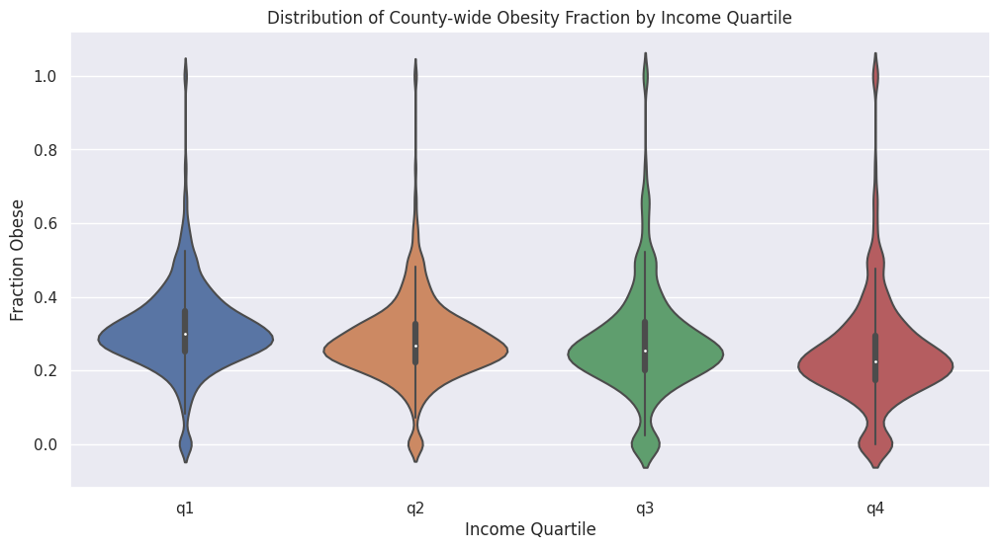

In [ ]:
plt.figure(figsize=(12, 6))
plt.title('Distribution of County-wide Obesity Fraction by Income Quartile')
sns.violinplot(cty_obese_data.dropna(), x='income_q', y='obese_frac')
plt.xlabel('Income Quartile')
plt.ylabel('Fraction Obese');

Looking at the plot, we can see that there is a slight general trend of decreasing obesity fraction with increasing income quartile. The first income quartile has the highest obesity fraction, while the fourth income quartile has the lowest. The distribution for income quartiles 1 and 2 are larger than quartile 3 and 4. We also see quartiles 3 and 4 having a larger left tail, indicating there are more individuals who are less obese than income quartles 1 and 2.


In [ ]:
create_chloropleth(cty_data, 'bmi_obese_q1', 'Fraction Obese in County').show()

We can see that overall fraction of obesity is pretty low across all counties for individuals in the bottom income quartile, as indicated by the dark blue and purple colors. However, we see that there are some areas have higher rates of obesity, particularly we see them in the Mid-west and South region of the US, as indicated by the bright yellow and green areas.


In [ ]:
create_chloropleth(cty_data, 'bmi_obese_q4', 'Fraction Obese in County').show()

Looking at the chloropleth map above, we see that overall fraction of obesity is pretty low across all counties for individuals in the top income quartile, as indicated by the dark blue and purple colors. However, we see that there are some areas that have high rates of obesity, particularly we see them in the Mid-west and South region of the US, as indicated by the bright yellow and green areas.


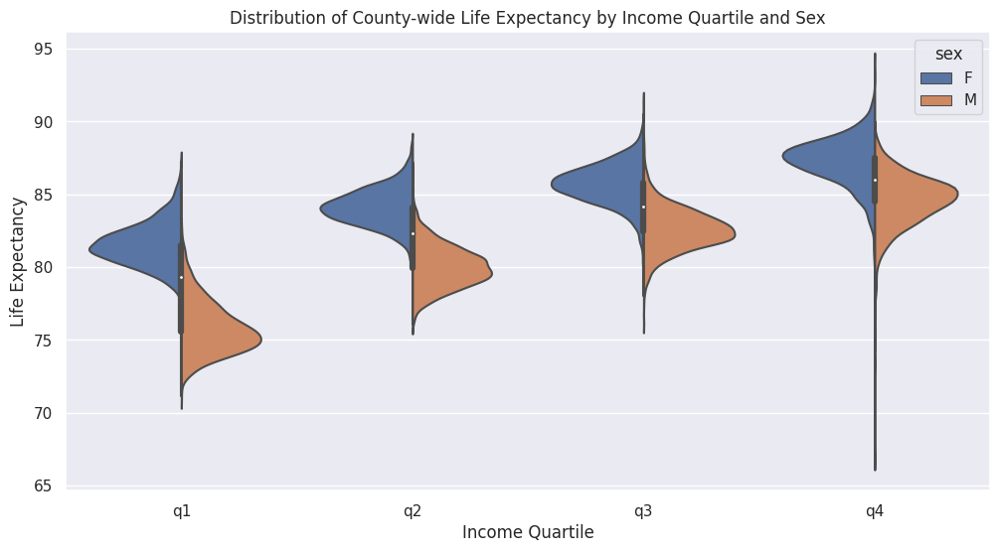

In [ ]:
plt.figure(figsize=(12, 6))
plt.title('Distribution of County-wide Life Expectancy by Income Quartile and Sex')
sns.violinplot(cty_le_data.dropna(), x='income_q', y='life_expectancy', hue='sex', split=True)
plt.xlabel('Income Quartile')
plt.ylabel('Life Expectancy');

Examining the violin plot above, we see that across all income quartiles, females generally live longer than males do. Additionally, we see life expectancy increasing as you move up income quartiles.

In [ ]:
create_chloropleth(cty_data, 'weighted_le_q1', 'Weighted Life Expectancy by County').show()

Looking at the chloropleth map above, we see that individuals in the first income quartle have a lower life expectancy across the map. However, the West Coast has a greater life expectancy indicated by the yellow and greener colors. Which differs from the rest of the US, particularly the mid-west and the South, which appears to have a lower life expectancy, as indicated by the darker blue and purple colors.


In [ ]:
create_chloropleth(cty_data, 'weighted_le_q4', 'Weighted Life Expectancy by County').show()

Examining the chloropleth map above, we see that individuals in the 4th income quartile generally have relatively high life expectancies across all regions which are indicated by the bright yellow and greener colors.


In [ ]:
le_obese_plot_data = cty_le_data.merge(cty_obese_data, on=['fips', 'income_q']).dropna()

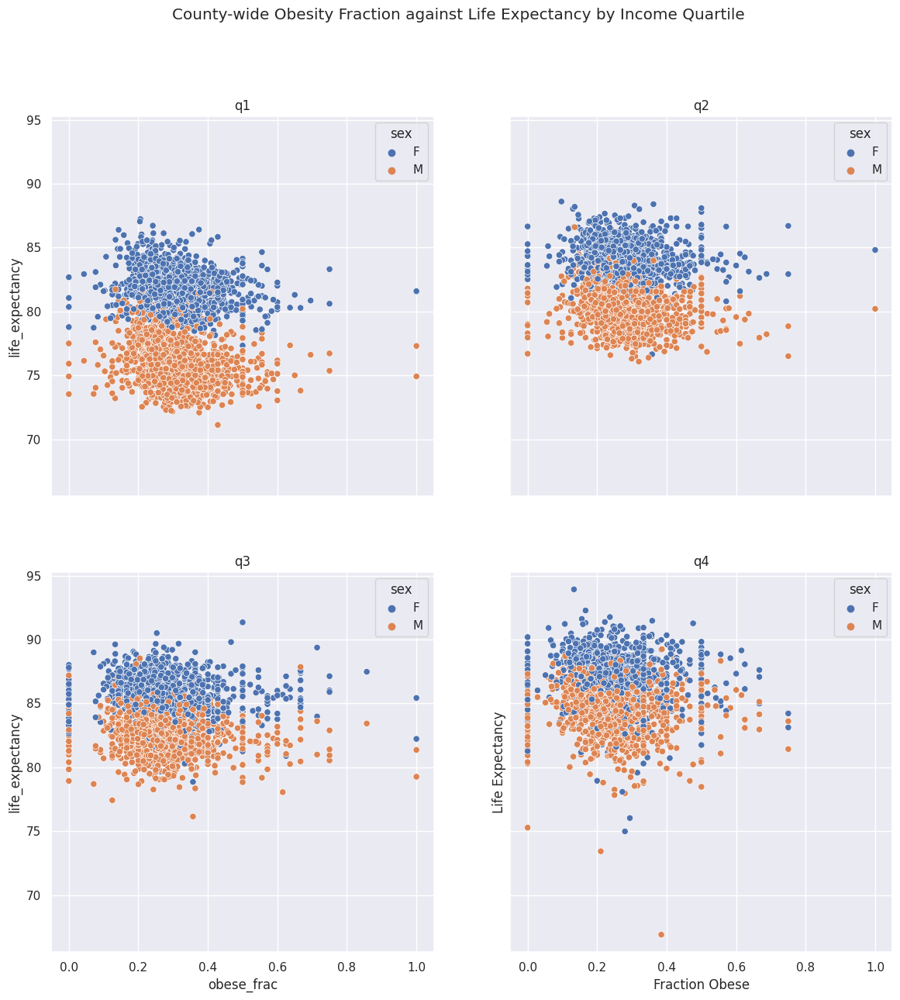

In [ ]:
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(14, 14))
fig.suptitle('County-wide Obesity Fraction against Life Expectancy by Income Quartile')
quartile_names = np.array(['q1', 'q2', 'q3', 'q4']).reshape((2, 2))
for i in range(len(axes)):
  for j in range(len(axes[0])):
    current_q = quartile_names[i, j]
    axes[i, j].set_title(current_q)
    sns.scatterplot(ax=axes[i, j], data=le_obese_plot_data[le_obese_plot_data['income_q'] == current_q],
                    x='obese_frac', y='life_expectancy', hue='sex')
    plt.xlabel('Fraction Obese')
    plt.ylabel('Life Expectancy')

Examining the graph above, we see that across all income quartiles, females tend to have a longer life expectancy on average. Additionally, there appears to be a negative correlation between life expectancy and the obesity rate in income quartiles 1 and 2, but less clear for income quartiles 3 and 4.


## Modeling

**Question 1 :** We are choosing to do a simple linear regression, in order to determine the statistical significance of our obese_frac variable and determine if it has a big effect on life expectancy. Additionally, we are choosing to do a Lasso regression to reinforce our first OLS model because we want to see if our variable of interest, obese_frac, will be one of the variables that remains, meaning that it is one of the important predictors. The features that we are using are all of the income quartile dummy variables to differentiate between individuals who belong in each quartile, dropping the first in order to avoid the dummy variable drop. Along with a sex dummy variable, to differentiate between men and women, dropping female, and having that as our base reference. Lastly, we include our variable of interest obese_frac. Examining the first OLS table, we see that all of our variables are statistically significant at all relevant significant levels because our P-value is 0. Evaluating our baseline for this model, we see that an individual who belongs in the first quartile, and is female, and that is not obese, has an average life expectancy of 81.8 years. Looking at the r^2 of our OLS model is 81.1%, meaning that our linear regression model explains 81.1% of the variation in life expectancy. Examining our lasso model, we unfortunately see that our obese_frac variable is not a strong predictor of our model, since the value is very close to 0.

**Question 2 :** We chose to do linear regression and random forests to predict life expectancy based on various features. Linear regression was used to determine the statistical significance of the "obese_frac" variable and see if it has a significant effect on life expectancy. We also used Lasso regression to see if "obese_frac" remains one of the important predictors after regularization. Random Forests were used to capture any non-linear relationships between the features and the response variable.

The features used in our models include income quartile dummy variables ("income_q_q2", "income_q_q3", "income_q_q4") to differentiate individuals belonging to each quartile, with the first quartile as the base reference, a sex dummy variable ("sex_M") to differentiate between men and women with female as the base reference, and the "obese_frac" variable. These features were selected based on previous research that identified income, sex, and obesity as important predictors of life expectancy.

In the linear regression model, all the features were statistically significant at all relevant significant levels, with a p-value of 0. The R-squared of our OLS model is 80.5%, indicating that the model explains 80.5% of the variation in life expectancy. In the Lasso model, the "obese_frac" variable was not a strong predictor, with a coefficient value close to zero, indicating that it may not be an important predictor of life expectancy in our model.


### Question 1

Simple OLS using dummy variables for `sex` and income quartile (`income_q`), with omission of 1 category for each to prevent collinearity.

In [ ]:
obese_model = smf.ols(formula='life_expectancy ~ obese_frac + income_q + sex + 1',
                          data=model_obese_data)
obese_model_ols = obese_model.fit()
obese_model_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        life_expectancy   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                 1.032e+04
Date:                Tue, 02 May 2023   Prob (F-statistic):               0.00
Time:                        04:48:49   Log-Likelihood:                -22884.
No. Observations:               12064   AIC:                         4.578e+04
Df Residuals:                   12058   BIC:                         4.582e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         81.8020      0.065   1263.472      0.000      81.675      81.929
income_q[T.q2]     3.2542      0.042     78.138      0.000       3.173       3.336
income_q[T.q3]     5.2769      0.042    124.778      0.000       5.194       5.360
income_q[T.q4]     6.9671      0.043    160.898      0.000       6.882       7.052
sex[T.M]          -3.9085      0.029   -133.060      0.000      -3.966      -3.851
obese_frac        -3.6870      0.183    -20.161      0.000      -4.045      -3.329
==============================================================================
Omnibus:                      752.553   Durbin-Watson:                   1.493
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2731.071
Skew:                          -0.230   Prob(JB):                         0.00
Kurtosis:                       5.285   Cond. No.                         16.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Lasso regression with 5-fold cross validation to optimize the $\alpha$ parameter (coefficient penalty) of lasso using the same regressors as above.

In [ ]:
obese_lasso_data = model_obese_data.drop(['income_q', 'sex'], axis=1).join(
    pd.get_dummies(model_obese_data[['income_q', 'sex']], drop_first=True)
)

In [ ]:
obese_model_lasso = LassoCV()
X_obese, y_obese = obese_lasso_data.drop('life_expectancy', axis=1), obese_lasso_data['life_expectancy']
obese_model_lasso.fit(X_obese, y_obese)
print('R2:', round(obese_model_lasso.score(X_obese, y_obese), 4))
print('Chosen alpha:', obese_model_lasso.alpha_)
res_obese = pd.DataFrame(index=obese_model_lasso.feature_names_in_, data=obese_model_lasso.coef_, columns=['coef'])
res_obese.loc['intercept', 'coef'] = obese_model_lasso.intercept_
res_obese

R2: 0.8106
Chosen alpha: 0.0009771309789456237


,coef
obese_frac,-3.557253
income_q_q2,3.242703
income_q_q3,5.266686
income_q_q4,6.960256
sex_M,-3.904615
intercept,81.772075


### Question 2

Simple OLS using dummy variables for `sex` and income quartile (`income_q`), with omission of 1 category for each to prevent collinearity. Using the `log` of `exp_p_capita` as the distribution of `exp_p_capita` values is skewed heavily to the right.

In [ ]:
exp_model = smf.ols(formula='life_expectancy ~ log_exp_p_capita + income_q + sex + 1',
                          data=model_exp_data)
exp_model_ols = exp_model.fit()
exp_model_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        life_expectancy   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                 1.006e+04
Date:                Tue, 02 May 2023   Prob (F-statistic):               0.00
Time:                        04:48:49   Log-Likelihood:                -23280.
No. Observations:               12192   AIC:                         4.657e+04
Df Residuals:                   12186   BIC:                         4.662e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           80.2888      0.071   1138.393      0.000      80.151      80.427
income_q[T.q2]       3.3918      0.042     81.057      0.000       3.310       3.474
income_q[T.q3]       5.4498      0.042    130.240      0.000       5.368       5.532
income_q[T.q4]       7.2247      0.042    172.656      0.000       7.143       7.307
sex[T.M]            -3.8911      0.030   -131.507      0.000      -3.949      -3.833
log_exp_p_capita     0.0922      0.017      5.459      0.000       0.059       0.125
==============================================================================
Omnibus:                      792.396   Durbin-Watson:                   1.463
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2830.876
Skew:                          -0.258   Prob(JB):                         0.00
Kurtosis:                       5.303   Cond. No.                         20.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Implemented `RandomForestRegressor` model with a maximum depth of 7 using the same regressors as above.

In [ ]:
exp_forest_data = model_exp_data.drop(['income_q', 'sex'], axis=1).join(
    pd.get_dummies(model_exp_data[['income_q', 'sex']], drop_first=True)
)

In [ ]:
X_exp, y_exp = exp_forest_data.drop('life_expectancy', axis=1), exp_forest_data['life_expectancy']

In [ ]:
exp_model_forest = RandomForestRegressor(max_depth=7).fit(X_exp, y_exp)
print('Score:', round(exp_model_forest.score(X_exp, y_exp), 4))
res_exp = pd.DataFrame(index=exp_model_forest.feature_names_in_, data=exp_model_forest.feature_importances_, columns=['Feature Importance (Gini importance)'])
res_exp.sort_values('Feature Importance (Gini importance)', ascending=False)

Score: 0.8431


,Feature Importance (Gini importance)
sex_M,0.326852
income_q_q4,0.307866
income_q_q3,0.215749
income_q_q2,0.132248
log_exp_p_capita,0.017286


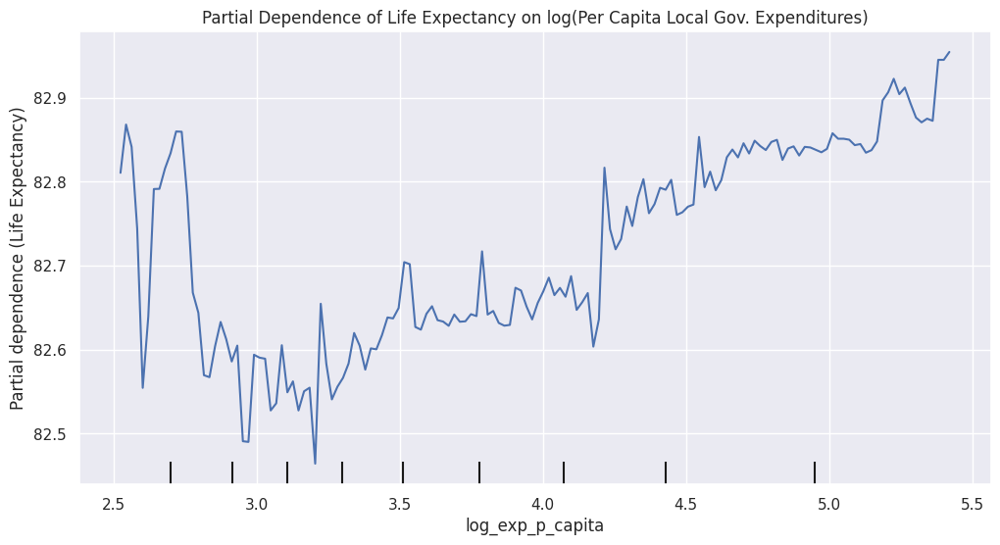

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
plt.title('Partial Dependence of Life Expectancy on log(Per Capita Local Gov. Expenditures)')
PartialDependenceDisplay.from_estimator(exp_model_forest, X_exp, ['log_exp_p_capita'], ax=ax, grid_resolution=150)
plt.ylabel('Partial dependence (Life Expectancy)')
plt.show();

The above plots the conditional expectation (partial dependence) of life expectancy on `log_exp_p_capita`.

## Interpretation and Conclusions

**Question 1 :** Both models show that obesity has a negative impact on life expectancy when controlling for income quartiles and gender, based on both the R-Squared value (0.811 in the linear model and 0.8106 in the lasso regression model) and the coefficient values for the features. Both models also showed that being in a higher income quartile positively impacted life expectancy. A policy decision that could be made based on this information is to focus on decreasing obesity rates in areas of lower income, through methods such as awareness campaigns and increasing access to nutritional guidance and healthcare.

Some potential flaws with these results might be that we did not account for other factors that may also be affecting life expectancy and may be more important to focus on, such as smoking rates, exercise and access to healthy food. Furthermore, that alpha value for the lasso regression is quite low. While this value was chosen by cross-validation, and is therefore the optimal alpha value for this dataset, this may still mean that our model is at risk of overfitting, and we would need to test this model on new data to evaluate this further.

**Question 2 :** After doing our data analysis, and observing our models, we determined that our variable of interest, local government expenditure per capita is important, but not to the extent that we originally thought. This is demonstrated through our linear regression model, as ‘log_exp_p_capita’, is statistically significant at all relevant significance levels due to the p-value being 0. Additionally, the coefficient for it is positive, meaning that it does increase life expectancy on average holding everything else constant. However, our random forest regressor model, showed that the local government expenditure per capita variable is only 0.017 in feature importance, so not as big as we had imagined it to be. From these results, a policy decision that one can recommend is to advocate for local government expenditures but being specific in where those funds go to. For example, advocating for more health measures would be a good allocation of local government expenditures. A reader should care about these results because it is in the government’s and one’s own individual interest to maximize life expectancy.

Similar to the first prediction question above, a potential flaw with these results is the lack of including more features to the model. Additionally, we do not know what exactly “local government expenditures per capita” go towards, due to the variable being general. To expand on this, we do not know if the majority of the local government expenditures are going to measures in public health that improve well being and life expectancy. So that is an important aspect to consider in our results and for future research going forward.


## Post-Analysis Reproducibility (10 points)

You will need to make sure that your code can be run by another team and by us.  This will mean making sure that all steps run in sequence, and hopefully that all the datasets are easily read via file paths.

We are anticipating that the easiest way to share will be via Google Colab. You are welcome to work on Datahub, on your local install, or any way you like.  However you will be expected to make sure that your complete notebook can run on Colab at the end of the project.  Please keep this in mind and save time to fiddle with things so it works!


Please share your Google Colab (or equivalent) link in this [sheet](https://docs.google.com/spreadsheets/d/15oNmFwpjSHifnyPvJJ8Gv3ECNOPKHsIWvvt0EbkyXVU/edit?usp=sharing). Each group will be assigned another group's link randomly (in the same sheet) to review and run without issues. Please confirm and leave comments about issues about this in the sheet as well.

This part is to ensure that we're building replicable and reusable code. Please refer to [section 9](https://docs.google.com/presentation/d/12eIuPKYZ8PMysm0pSxoClnh4YOQFRqHO6qVv2SN23Xc/edit?usp=share_link) for best practices of this.